<a href="https://colab.research.google.com/github/aadya20245001/Error-Vision_Quest-/blob/main/vision_quest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics opencv-python


In [ ]:

import cv2
import numpy as np
import time
from google.colab.patches import cv2_imshow
from ultralytics import YOLO


In [ ]:

model = YOLO("yolov8n.pt")
print("YOLOv8 model loaded!")

YOLOv8 model loaded!


In [ ]:

video_path = "drone.mp4"
cap = cv2.VideoCapture(video_path)

In [ ]:

trajectory = {}
yaw_dict = {}
save_output = True
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = None
first_frame = True
prev_time = time.time()

YOLOv8 model loaded!


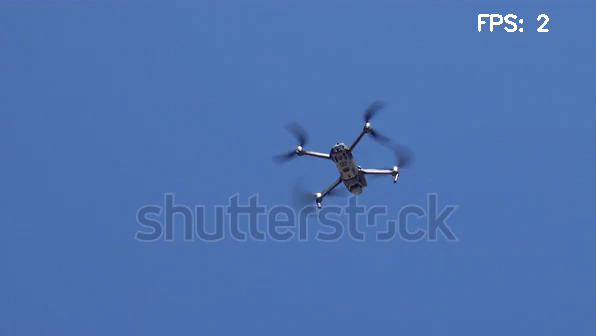

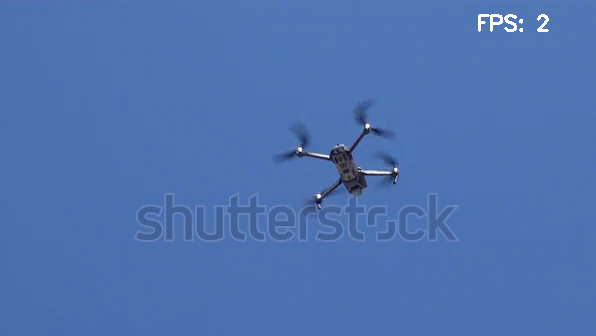

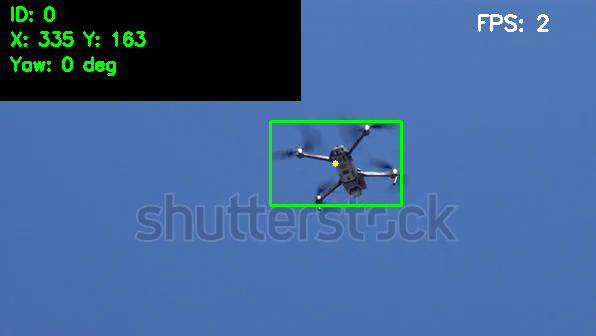

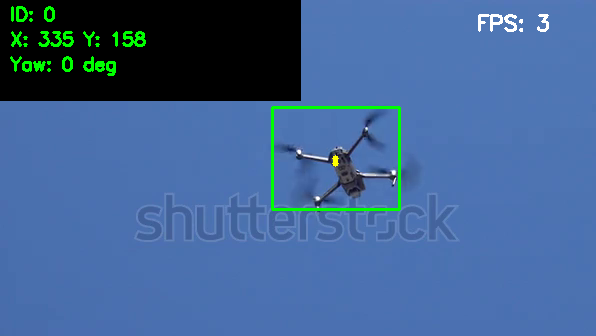

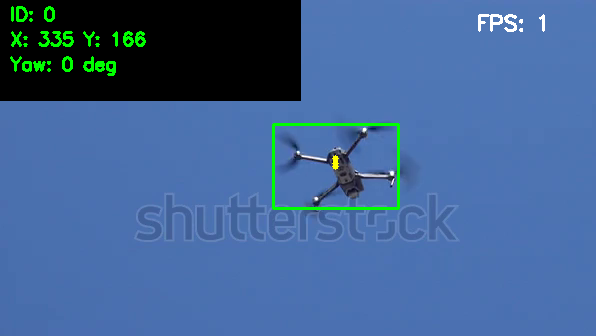

...

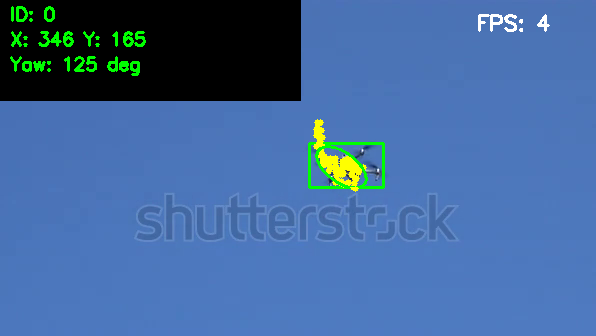

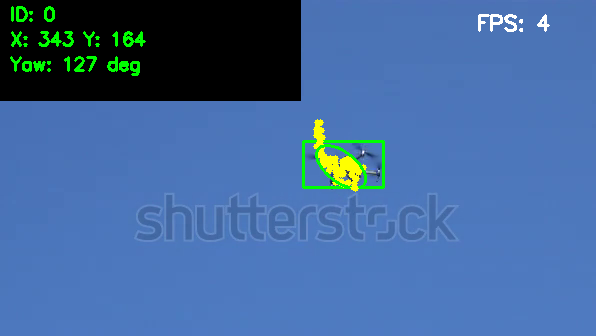

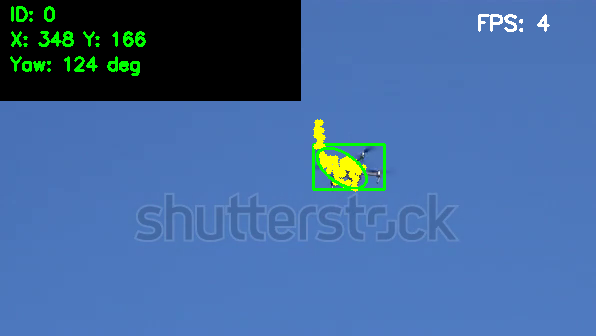

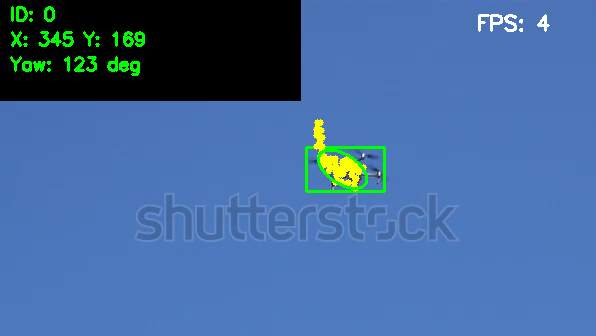

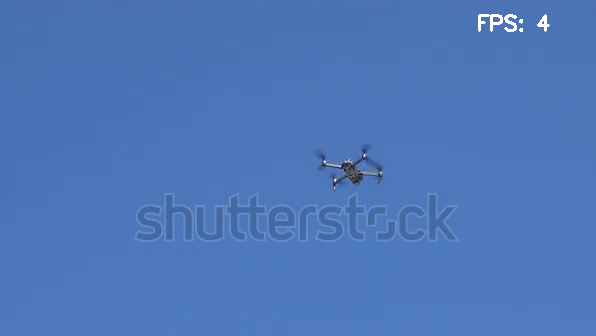

Processing done! Saved video to output_gui.mp4


In [ ]:

while True:
    ret, frame = cap.read()
    if not ret:
        break

    h, w = frame.shape[:2]

    # ---- YOLO Detection ----
    results = model(frame, verbose=False)[0]
    boxes = []
    for box in results.boxes.data:
        x1, y1, x2, y2, conf, cls = box.tolist()
        boxes.append([x1, y1, x2, y2, conf])

    dets = np.array(boxes, dtype=np.float32) if len(boxes) > 0 else np.empty((0, 5), dtype=np.float32)

    # ---- SIMPLE TRACKING USING CENTERS ----
    tracks = []
    for i, det in enumerate(dets):
        x1, y1, x2, y2, conf = det
        track_id = i  # simple index as ID
        tracks.append([x1, y1, x2, y2, track_id])

    # ---- DRAW TRACKS ----
    for track in tracks:
        x1, y1, x2, y2, track_id = [int(v) for v in track]
        cx, cy = (x1 + x2)//2, (y1 + y2)//2
        cx_norm, cy_norm = cx/w, cy/h

        # Bounding box + ID
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0,255,0), 2)

        # Trajectory
        if track_id not in trajectory:
            trajectory[track_id] = []
        trajectory[track_id].append((cx, cy))
        for p in trajectory[track_id]:
            cv2.circle(frame, p, 3, (0,255,255), -1)

        # ---- YAW ESTIMATION (robust) ----
        roi = frame[y1:y2, x1:x2]
        angle = yaw_dict.get(track_id, 0)  # fallback to last known
        try:
            gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            _, th = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            contours, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in contours:
                if cv2.contourArea(cnt) > 300 and len(cnt) >= 5:
                    ellipse = cv2.fitEllipse(cnt)
                    angle = ellipse[2]
                    yaw_dict[track_id] = angle
                    cv2.ellipse(roi, ellipse, (0,255,0), 2)
                    break
        except:
            pass  # fail-safe

        # ---- INFO PANEL ----
        cv2.rectangle(frame, (0,0), (300,100), (0,0,0), -1)
        cv2.putText(frame, f"ID: {track_id}", (10,20), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0),2)
        cv2.putText(frame, f"X: {cx} Y: {cy}", (10,45), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0),2)
        cv2.putText(frame, f"Yaw: {int(angle)} deg", (10,70), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0),2)

    # ---- FPS ----
    curr_time = time.time()
    fps = 1.0 / (curr_time - prev_time + 1e-6)
    prev_time = curr_time
    cv2.putText(frame, f"FPS: {int(fps)}", (w-120, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)

    # ---- Save output ----
    if save_output:
        if first_frame:
            out = cv2.VideoWriter("output_gui.mp4", fourcc, 20, (w, h))
            first_frame = False
        out.write(frame)

    # ---- Show frame in Colab ----
    cv2_imshow(frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# ---- CLEANUP ----
cap.release()
if out:
    out.release()
cv2.destroyAllWindows()
print("Processing done! Saved video to output_gui.mp4")


In [ ]:
from google.colab import files
files.download("output_gui.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>